# Лабораторная работа № 6
**Вариант:** 9

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from random import choice
import matplotlib.animation as animation
from IPython.display import HTML
from tqdm import tqdm

from sklearn.datasets import make_blobs
from ipywidgets import interact, IntSlider
from matplotlib.collections import LineCollection
from PIL import Image

In [2]:
%matplotlib inline
import matplotlib_inline
matplotlib_inline.backend_inline.set_matplotlib_formats('retina', 'pdf')
plt.rcParams['figure.dpi'] = 100

In [58]:
class SOM:
    def __init__(self, width, height, dim, r=None, nodes=None):
        self.width = width
        self.height = height
        self.dim = dim
        self.nodes = (nodes.copy() if nodes is not None else np.random.rand(height, width, dim)).reshape(-1, dim)
        self.indexes = np.stack(np.meshgrid(np.arange(height), np.arange(width), indexing='ij'), axis=-1).reshape(-1, 2)
        self.lr = None
        self.r = r or max(width, height) / 2
        self._lr = None
        self._r = self.r
        
    def update(self, data):
        for x in data:
            dist = np.sum((self.nodes - x) ** 2, axis=1)
            node = np.argmin(dist)
            dist = np.sqrt(np.sum((self.indexes - self.indexes[node]) ** 2, axis=1))
            influence = np.exp(- dist / (2 * self.r))
            self.nodes += self.lr * (influence * (dist <= self.r))[:, np.newaxis] * (x - self.nodes)
    
    def update_parameters(self, epoch, epochs):
        self.lr = max(0.01, self._lr * np.exp(-epoch / epochs))
        self.r = self._r * np.exp(-epoch * np.log(self._r) / epochs)
    
    def fit(self, data, epochs, lr=0.1, interval=1, verbose=False):
        self.lr = lr
        self._lr = lr
        nodes = [self.nodes.copy()]
        epochs_iter = range(epochs)
        if len(data.shape) == 1:
            data = data[np.newaxis, :]
        indexes = np.arange(len(data))
        if verbose:
            epochs_iter = tqdm(epochs_iter, ncols=70, desc='Epochs', ascii=True)
        for epoch in epochs_iter:
            np.random.shuffle(indexes)
            self.update(data[indexes])
            self.update_parameters(epoch+1, epochs)
            if (epoch+1) % interval == 0:
                nodes.append(self.nodes.copy())
        if verbose:
            epochs_iter.close()
        return nodes
    
    def predict(self, data):
        if len(data.shape) == 1:
            data = data[np.newaxis, :]
        res = np.zeros((data.shape[0],))
        for i, x in enumerate(data):
            res[i] = np.argmin(np.sum((self.nodes - x) ** 2, axis=1))
        return res

In [5]:
def plot_parameters(som, epochs):
    fig = plt.figure(figsize=(10, 3))
    epoch = np.arange(epochs)
    fig.add_subplot(121)
    plt.title('Learning rate')
    plt.plot(som._lr * np.exp(-epoch / epochs))
    fig.add_subplot(122)
    plt.title('Radius')
    plt.plot(som._r * np.exp(-epoch * np.log(som._r) / epochs))
    plt.show()

# Кластеризация точек

In [77]:
def animate_points_and_nodes(som, points, nodes, lines=True, xlim=None, ylim=None, interval=100, video=False):
    def animate(i, ax):
        ax.clear()
        artists = [ax.scatter(points[:, 0], points[:, 1], c='tab:blue', animated=True)]
        artists.extend(ax.plot(nodes[i][:, 0], nodes[i][:, 1], c='red', marker='.', ls='', ms=10, animated=True))
        if lines:
            artists.append(ax.add_collection(LineCollection(nodes[i].reshape(som.height, som.width, -1), linewidth=1, colors=(1,0,0,0.5), animated=True)))
            artists.append(ax.add_collection(LineCollection(nodes[i].reshape(som.height, som.width, -1).transpose(1, 0, 2), linewidth=1, colors=(1,0,0,0.5), animated=True)))
        return artists
            
    fig = plt.figure()
    ax = fig.gca()
    ax.set(aspect='equal', xlim=xlim, ylim=ylim)
    anim = animation.FuncAnimation(fig, animate, frames=len(nodes), interval=interval, fargs=(ax, ), blit=False)
    plt.close()
    if video:
        return HTML(anim.to_html5_video())
    else:
        return HTML(anim.to_jshtml())

def plot_points_and_nodes(som, points, nodes, epochs, lines=True, interval=1):
    if isinstance(epochs, int):
        epochs = np.linspace(0, len(nodes)-1, epochs, dtype=int)
    else:
        epochs = np.array(epochs, dtype=int)
    
    w = min(5, int(np.ceil(np.sqrt(len(epochs)))))
    h = (len(epochs) - 1) // w + 1
    
    fig = plt.figure(figsize=(3 * w, 3 * h))
    for i, k in enumerate(epochs, 1):
        fig.add_subplot(h, w, i)
        ax = fig.gca()
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)

        ax.set_title(f'Epoch {k*interval}', fontsize='medium')
        ax.scatter(points[:, 0], points[:, 1], c='tab:blue')
        ax.plot(nodes[k][:, 0], nodes[k][:, 1], c='red', marker='.', ls='', ms=10)
        if lines:
            ax.add_collection(LineCollection(nodes[k].reshape(som.height, som.width, -1), linewidth=1, colors=(1,0,0,0.5)))
            ax.add_collection(LineCollection(nodes[k].reshape(som.height, som.width, -1).transpose(1, 0, 2), linewidth=1, colors=(1,0,0,0.5)))
    
    fig.subplots_adjust(wspace=0.15, hspace=0.15)
    plt.show()
    
def interact_plot_points_and_nodes(som, points, nodes, epochs, lines=True):
    @interact(epoch=IntSlider(0, 0, epochs, description='Epoch'))
    def plot_points_and_nodes(epoch):
        _, ax = plt.subplots()
        ax.set_aspect('equal')
        plt.scatter(points[:, 0], points[:, 1])
        plt.plot(nodes[epoch][:, 0], nodes[epoch][:, 1], c='red', marker='.', ls='', ms=10)
        if lines:
            ax.add_collection(LineCollection(nodes[epoch].reshape(som.height, som.width, som.dim), linewidth=1, colors='red'))
            ax.add_collection(LineCollection(nodes[epoch].reshape(som.height, som.width, som.dim).transpose(1, 0, 2), linewidth=1, colors=(1,0,0,0.5)))
        plt.show()
        
def plot_clusters(point, classes, som=None, nodes=True, lines=True):
    fig = plt.figure(figsize=(10,5))

    ax = fig.add_subplot(121)
    ax.set(aspect='equal')
    ax.scatter(points[:, 0], points[:, 1], c=classes, cmap='Spectral')
    
    if som is not None:
        ax.set_title('Actual clusters')
        pred = som.predict(points)
        ax = fig.add_subplot(122)
        ax.set_title('Predicted clusters')
        ax.set(aspect='equal')
        ax.scatter(points[:, 0], points[:, 1], c=pred, cmap='Spectral')
        if nodes:
            ax.plot(som.nodes[:, 0], som.nodes[:, 1], c='red', marker='.', ls='', ms=10)
            if lines:
                ax.add_collection(LineCollection(som.nodes.reshape(som.height, som.width, som.dim), linewidth=1, colors='red'))
                ax.add_collection(LineCollection(som.nodes.reshape(som.height, som.width, som.dim).transpose(1, 0, 2), linewidth=1, colors=(1,0,0,0.5)))
    plt.show()

In [7]:
def generate_nodes(width, height, xlim=(0, 1), ylim=(0, 1)):
    x_linspace = np.linspace(xlim[0], xlim[1], height)
    y_linspace = np.linspace(ylim[0], ylim[1], width)
    nodes = np.stack(np.meshgrid(x_linspace, y_linspace, indexing='ij'), axis=-1).reshape(-1, 2)
    return nodes

## Конфигурация $1\times8$

In [97]:
n_clusters = 8
points_per_claster = 10
points, classes = make_blobs(n_clusters * points_per_claster, centers=n_clusters, center_box=(0, 1.5), cluster_std=0.1)

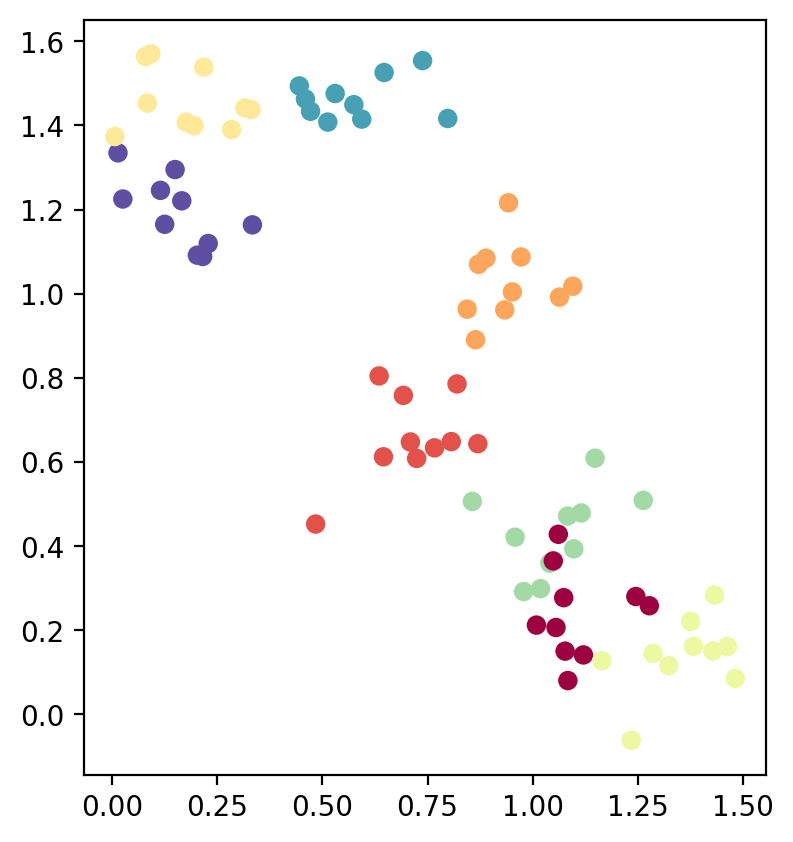

In [98]:
plot_clusters(points, classes)

In [99]:
start_nodes = generate_nodes(1, 8, (0, 1.5), (0.75, 0.75))

In [100]:
som = SOM(1, 8, 2, nodes=start_nodes)

epochs = 100
nodes = som.fit(points, epochs, lr=0.2, interval=2)

In [103]:
animate_points_and_nodes(som, points, nodes, video=True)

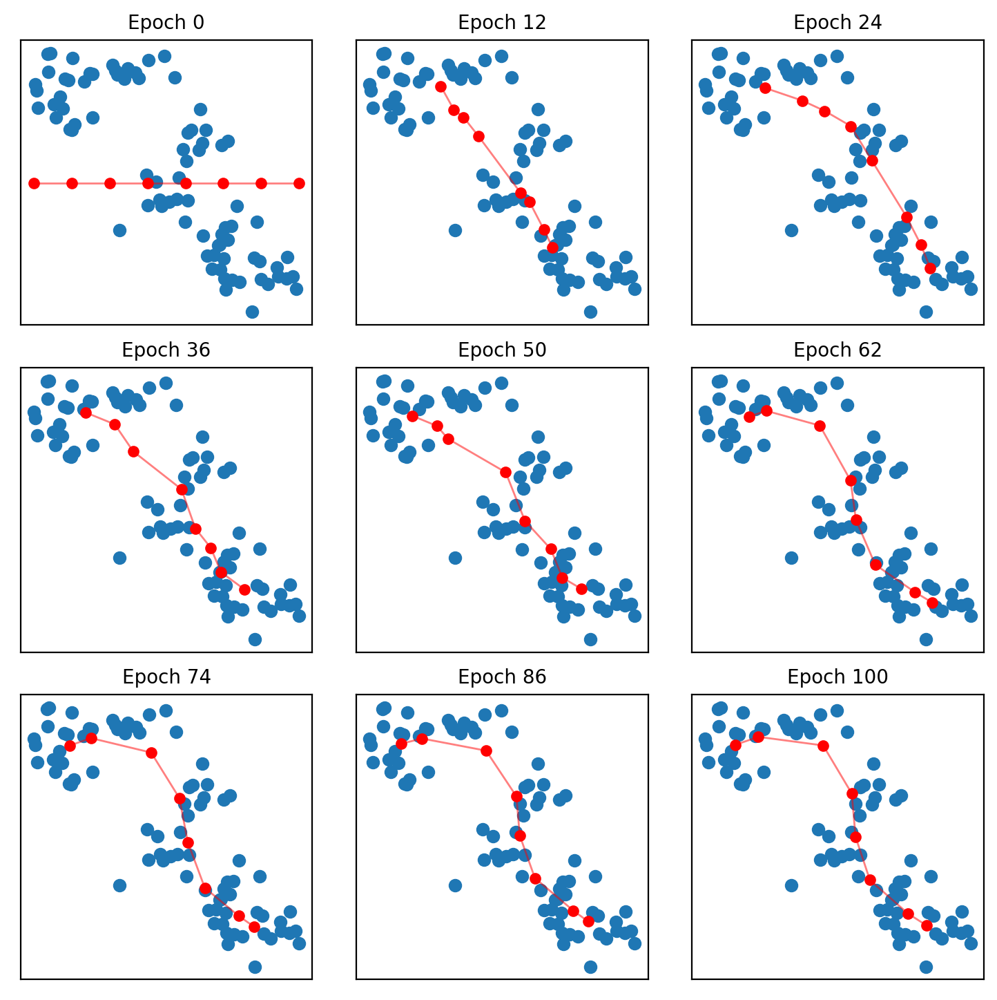

In [101]:
plot_points_and_nodes(som, points, nodes, 9, interval=2)

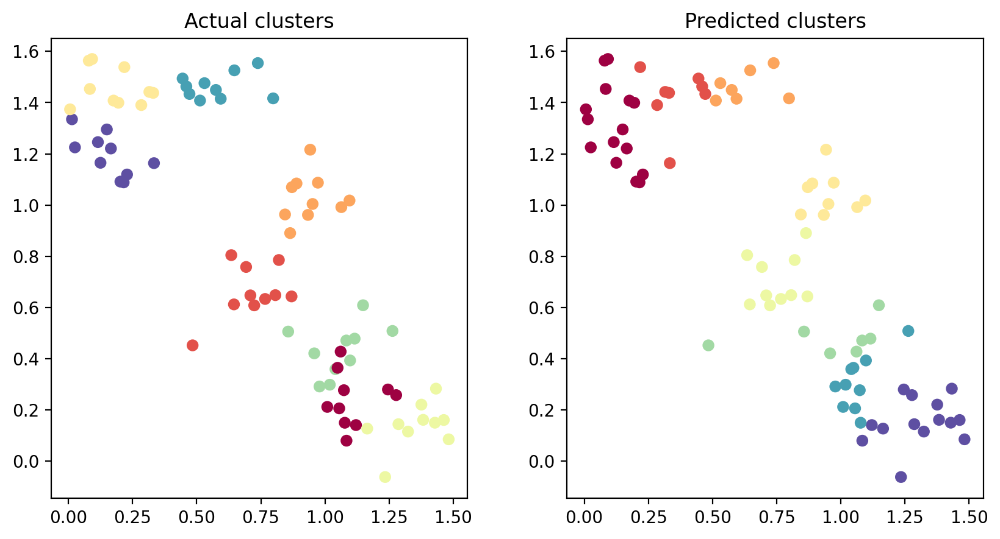

In [102]:
plot_clusters(points, classes, som, nodes=False)

## Конфигурация $3\times3$

In [104]:
n_clusters = 9
points_per_claster = 10
points, classes = make_blobs(n_clusters * points_per_claster, centers=n_clusters, center_box=(0, 1.5), cluster_std=0.1)

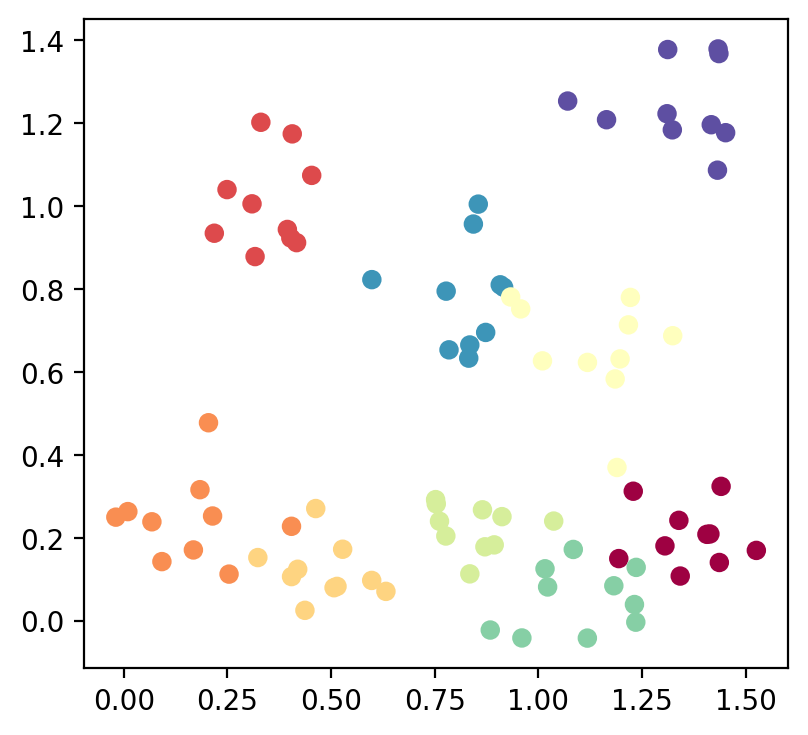

In [105]:
plot_clusters(points, classes)

In [106]:
start_nodes = generate_nodes(3, 3, (0.5, 1), (0.5, 1))

In [107]:
som = SOM(3, 3, 2, nodes=start_nodes)

epochs = 100
nodes = som.fit(points, epochs, lr=0.1)

In [110]:
animate_points_and_nodes(som, points, nodes, video=True)

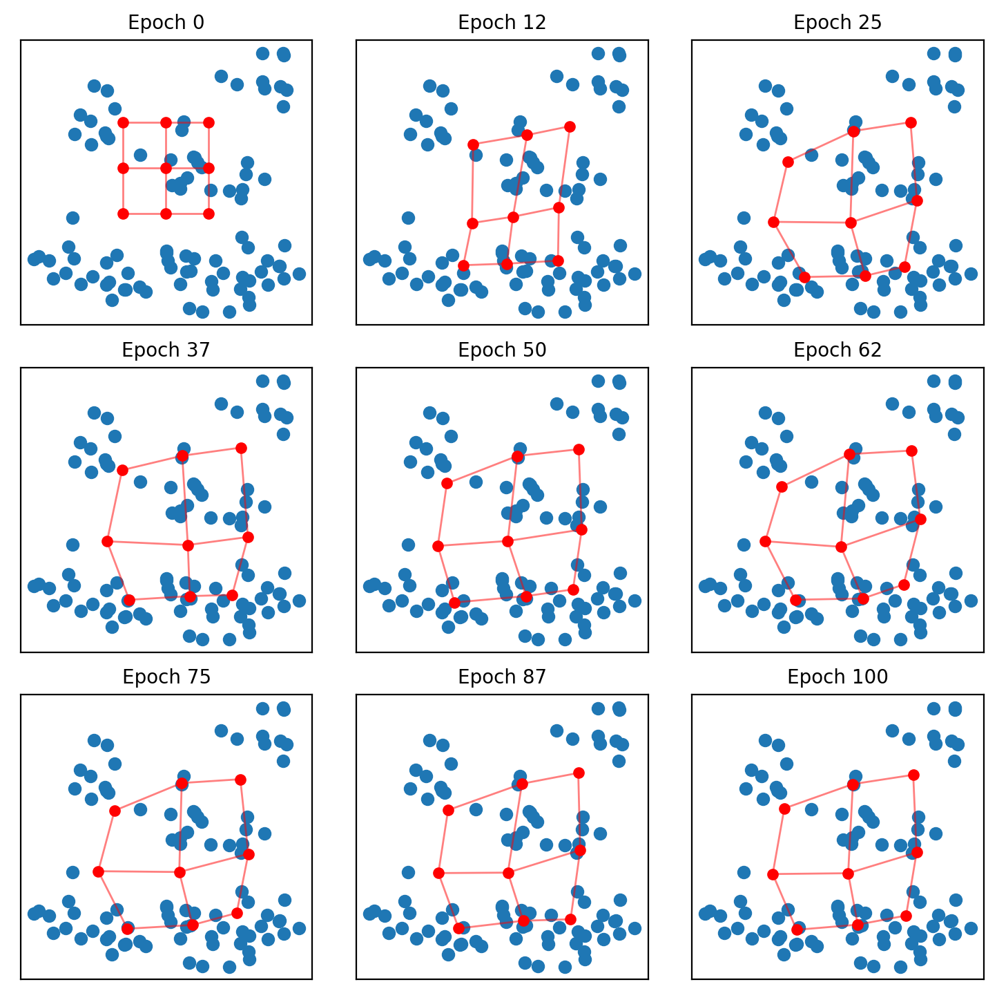

In [108]:
plot_points_and_nodes(som, points, nodes, 9)

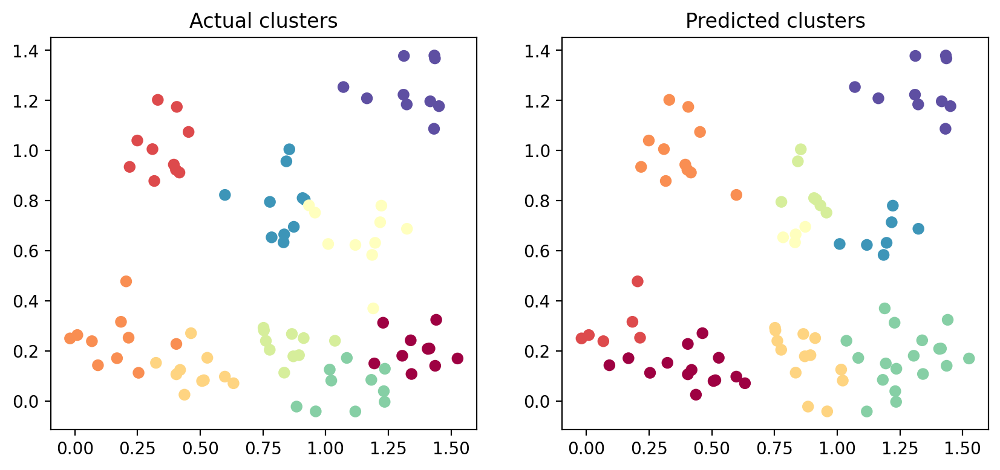

In [109]:
plot_clusters(points, classes, som, nodes=False)

# Задача коммивояжера

In [113]:
cities, _ = make_blobs(20, centers=1, center_box=(-1.5, 1.5))

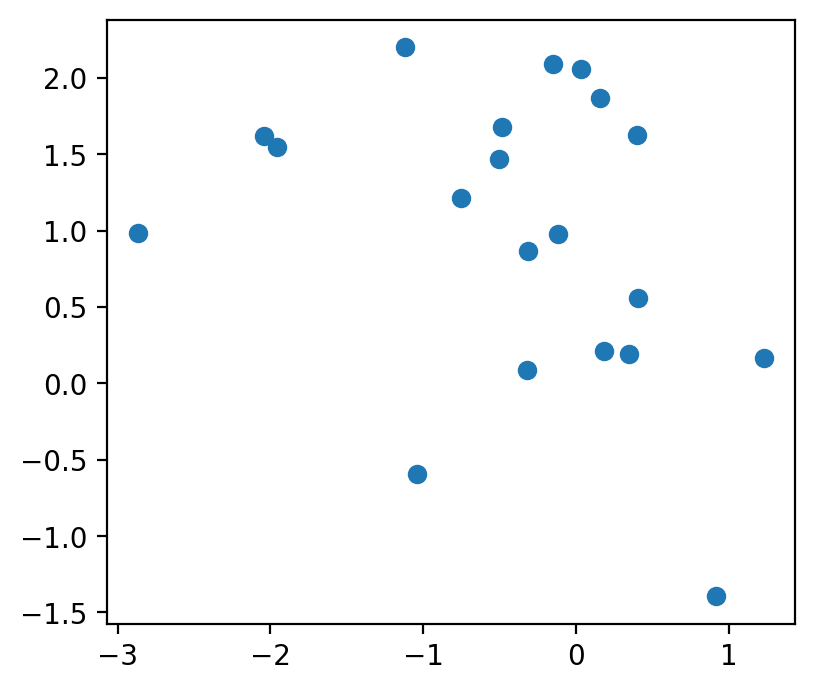

In [114]:
_, ax = plt.subplots()
ax.set(aspect='equal')
plt.scatter(cities[:, 0], cities[:, 1])
plt.show()

In [115]:
start_nodes = generate_nodes(1, len(cities), (cities[:,0].min(), cities[:,0].max()), (cities[:,1].mean(), cities[:,1].mean()))

In [116]:
som = SOM(1, len(cities), 2, nodes=start_nodes)

epochs = 1000
nodes = som.fit(cities, epochs, lr=0.5, verbose=True)

Epochs: 100%|####################| 1000/1000 [00:03<00:00, 251.66it/s]


In [121]:
animate_points_and_nodes(som, cities, nodes, video=True)

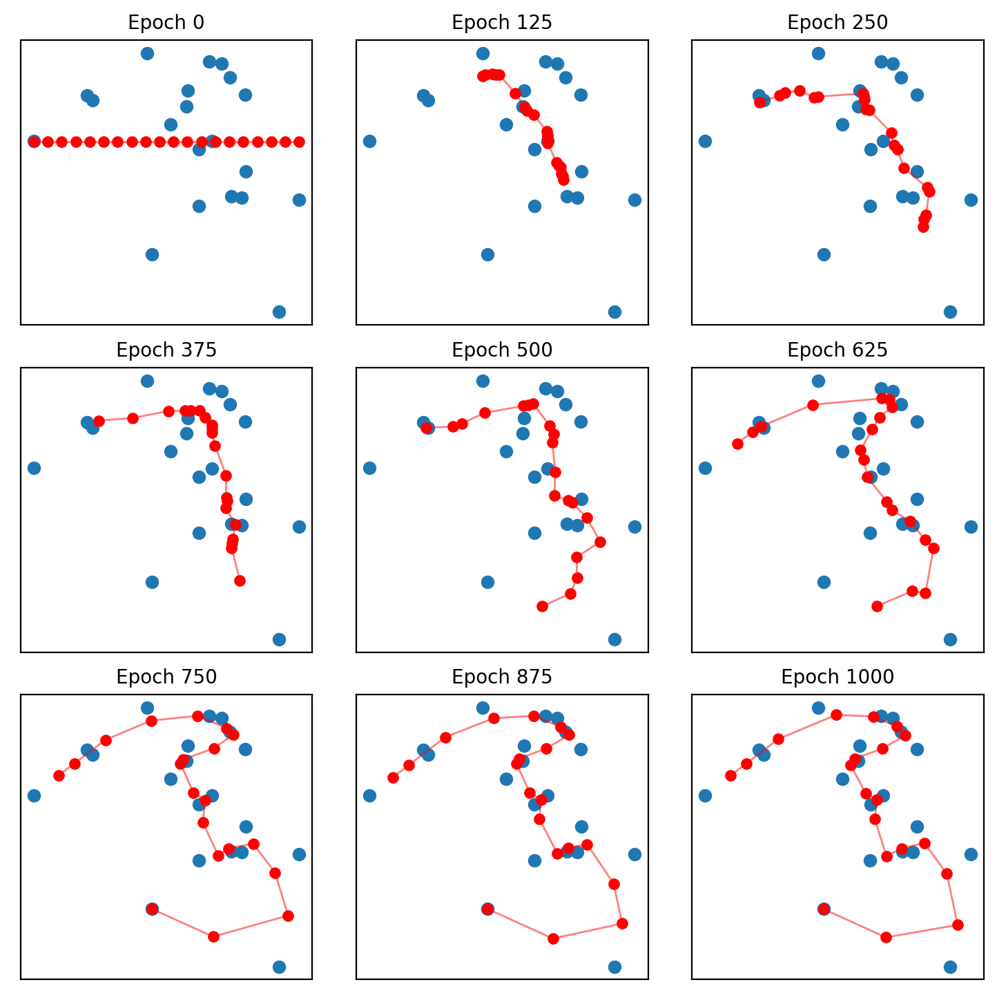

In [118]:
plot_points_and_nodes(som, cities, nodes, 9)

In [126]:
path = []
for node in som.nodes[::-1]:
    dist = np.sum((cities - node) ** 2, axis=1)
    dist[path] = dist.max()+1
    path.append(np.argmin(dist))
path

[2, 5, 17, 9, 12, 8, 18, 16, 3, 1, 6, 19, 4, 10, 11, 0, 7, 14, 13, 15]

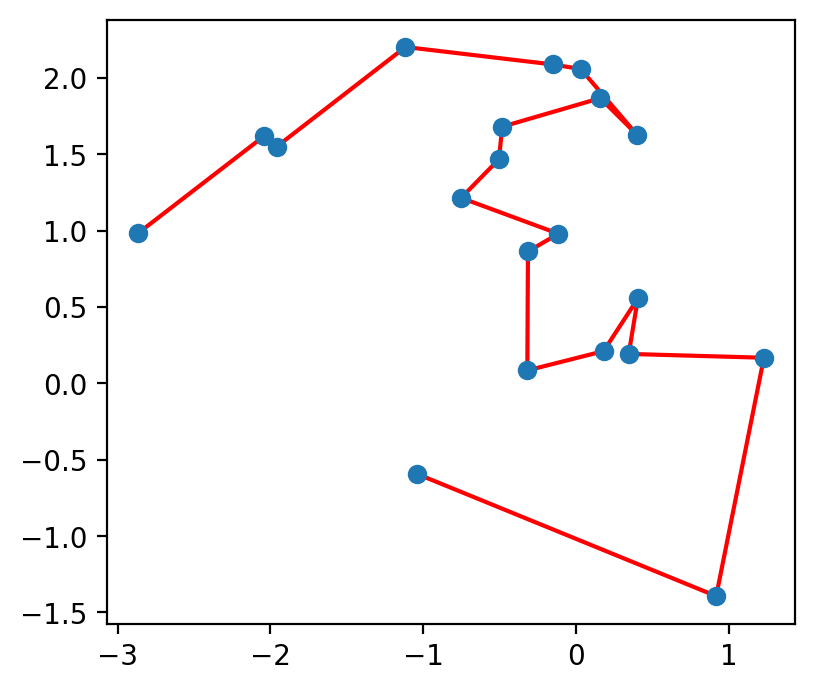

In [127]:
_, ax = plt.subplots()
ax.set_aspect('equal')
plt.plot(cities[path, 0], cities[path, 1], c='red', zorder=0)
plt.scatter(cities[:, 0], cities[:, 1], zorder=1)
plt.show()

# Кластеризация цветов

In [153]:
def animate_images(images, width, height, interval=75, video=False):
    def init():
        img.set_data(images[0].reshape(height, width, -1))
        return (img,)

    def animate(i):
        img.set_data(images[i].reshape(height, width, -1))
        return (img,)

    fig = plt.figure()
    ax = fig.gca()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    img = ax.imshow(images[0].reshape(height, width, -1))
    anim = animation.FuncAnimation(fig, animate, init_func=init,
                                   frames=len(images), interval=interval, blit=True)
    plt.close()
    if video:
        return HTML(anim.to_html5_video())
    else:
        return HTML(anim.to_jshtml())
    
def plot_images(images, width, height, epochs, interval=50, video=False):
    if isinstance(epochs, int):
        epochs = np.linspace(0, len(images)-1, epochs, dtype=int)
    else:
        epochs = np.array(epochs, dtype=int)
    
    w = min(5, int(np.ceil(np.sqrt(len(epochs)))))
    h = (len(epochs) - 1) // w + 1
    
    fig = plt.figure(figsize=(3 * w, 3 * h))
    for i, k in enumerate(epochs, 1):
        fig.add_subplot(h, w, i)
        ax = fig.gca()
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)

        ax.set_title(f'Epoch {k}', fontsize='medium')
        ax.imshow(images[k].reshape(height, width, -1))
    
    fig.subplots_adjust(wspace=0.15, hspace=0.15)
    plt.show()

In [154]:
def load_image(path, width=320, height=240):
    image = Image.open(path)
    image = image.convert('RGB')
    image = image.resize((width, height), Image.ANTIALIAS)
    image = np.asarray(image, dtype=np.float32)
    image /= 255
    return image

## Кластеризация по фиксированным цветам

In [155]:
width = 64
height = 48

In [156]:
data = np.array(((1, 0, 0), (0, 1, 0), (0, 0, 1), (1, 1, 0), (0, 1, 1)))

In [157]:
som = SOM(width, height, 3)

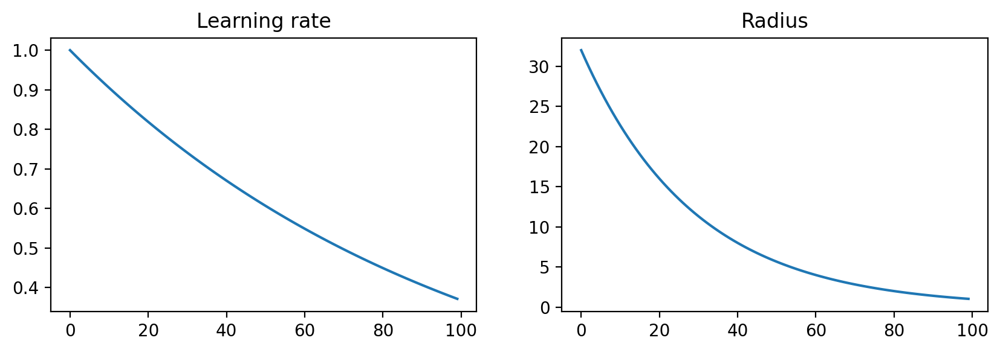

In [158]:
epochs = 100
images = som.fit(data, epochs, lr=1, interval=1)
plot_parameters(som, epochs)

In [160]:
animate_images(images[:epochs//2], width, height, video=True)

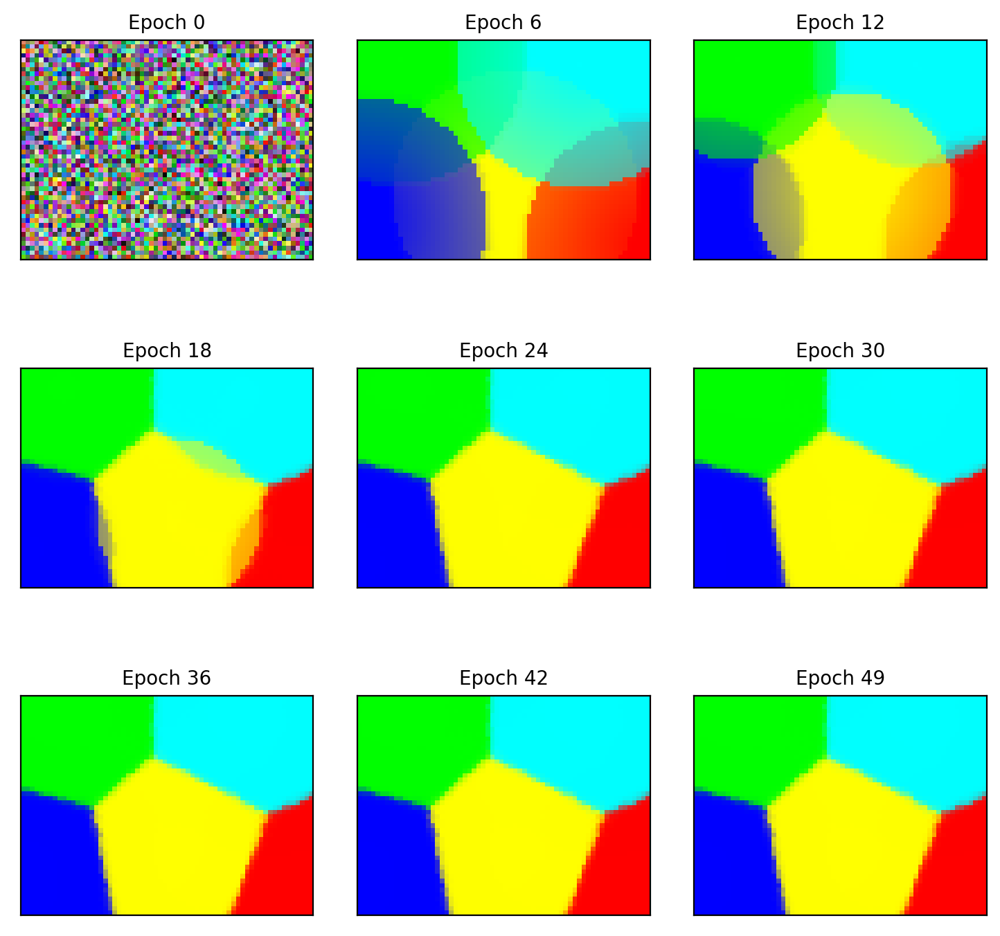

In [161]:
plot_images(images[:epochs//2], width, height, 9)

In [174]:
data = np.array(((1, 0, 0), (0, 1, 0), (0, 0, 1), (1, 1, 0), (0, 1, 1), (1, 0, 1), (1, 1, 1), (0, 0, 0)))

In [175]:
rgb = load_image('img/rgb.png', 100, 75)

In [176]:
som = SOM(rgb.shape[1], rgb.shape[0], rgb.shape[2], r=40, nodes=rgb)
epochs = 100
images = som.fit(data, epochs, lr=0.5)

In [177]:
animate_images(images[:epochs//2], rgb.shape[1], rgb.shape[0])

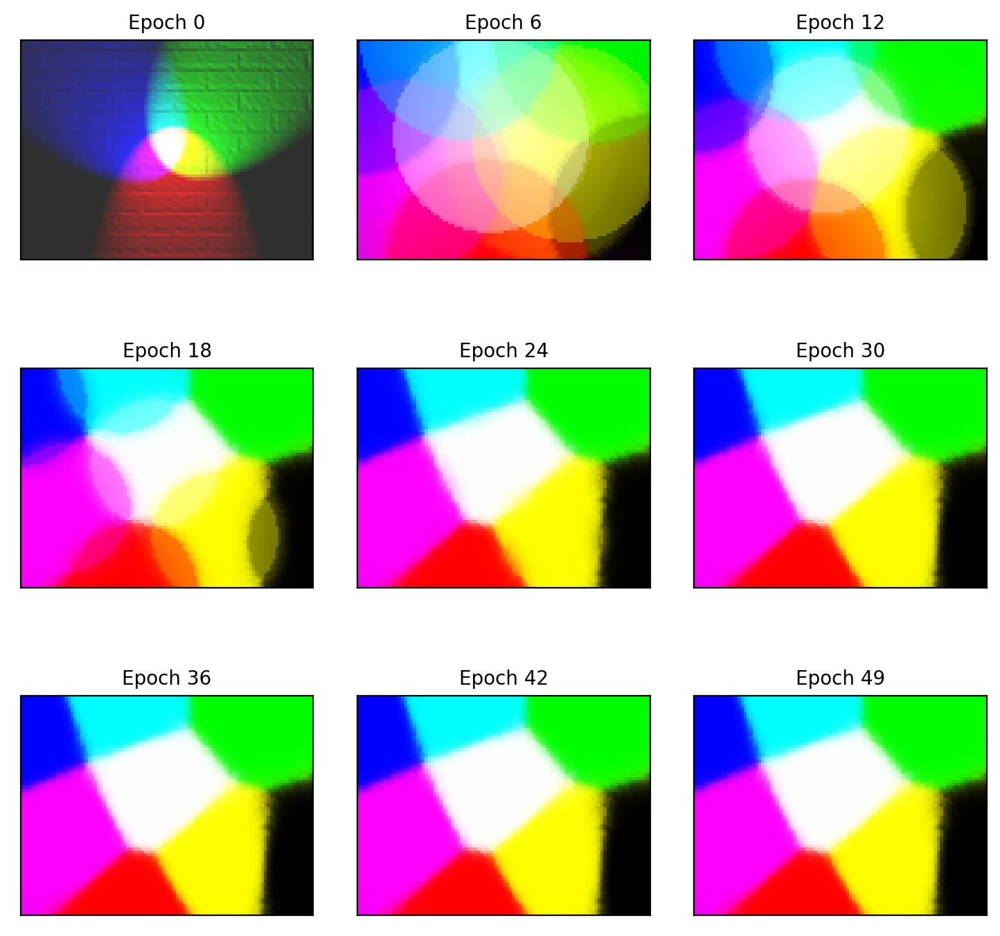

In [182]:
plot_images(images[:epochs//2], rgb.shape[1], rgb.shape[0], 9)

## Кластеризация по случайным цветам из изображения

In [164]:
def colors_from_image(image, count):
    rng = np.random.default_rng()
    colors = rng.choice(image.reshape(-1, 3), count, replace=False, shuffle=True)
    return colors

In [165]:
def plot_colors(colors):
    w = int(np.ceil(np.sqrt(len(colors))))
    h = (len(colors) - 1) // w + 1
    m = np.concatenate((colors, np.full((w * h - len(colors), 3), 1)))
    fig = plt.gcf()
    ax = fig.gca()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    ax.imshow(m.reshape(h, w, 3))
    plt.show()

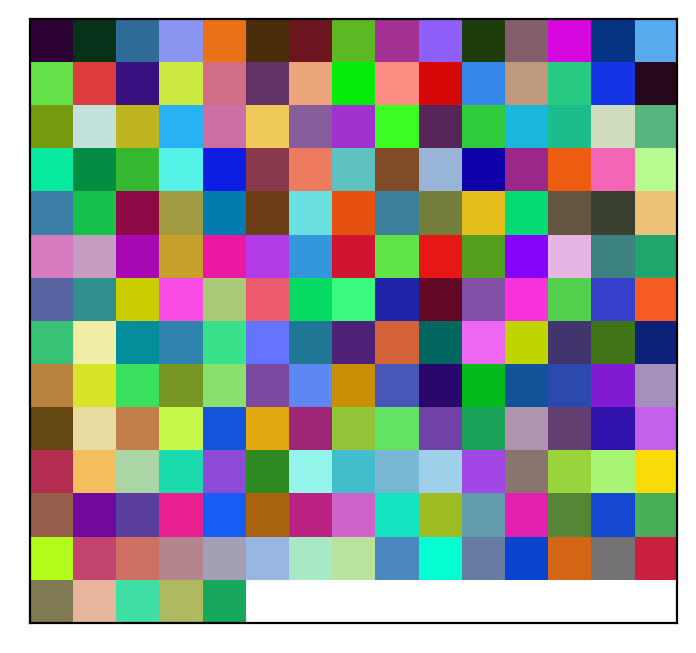

In [190]:
width = 120
height = 80
nodes = np.random.rand(height, width, 3)
colors = colors_from_image(nodes, 200)
plot_colors(colors)

In [191]:
som = SOM(width, height, 3, nodes=nodes)

epochs = 500
images = som.fit(colors, epochs, lr=0.1, interval=5, verbose=True)

Epochs: 100%|#######################| 500/500 [03:30<00:00,  2.37it/s]


In [192]:
animate_images(images, width, height, interval=100)

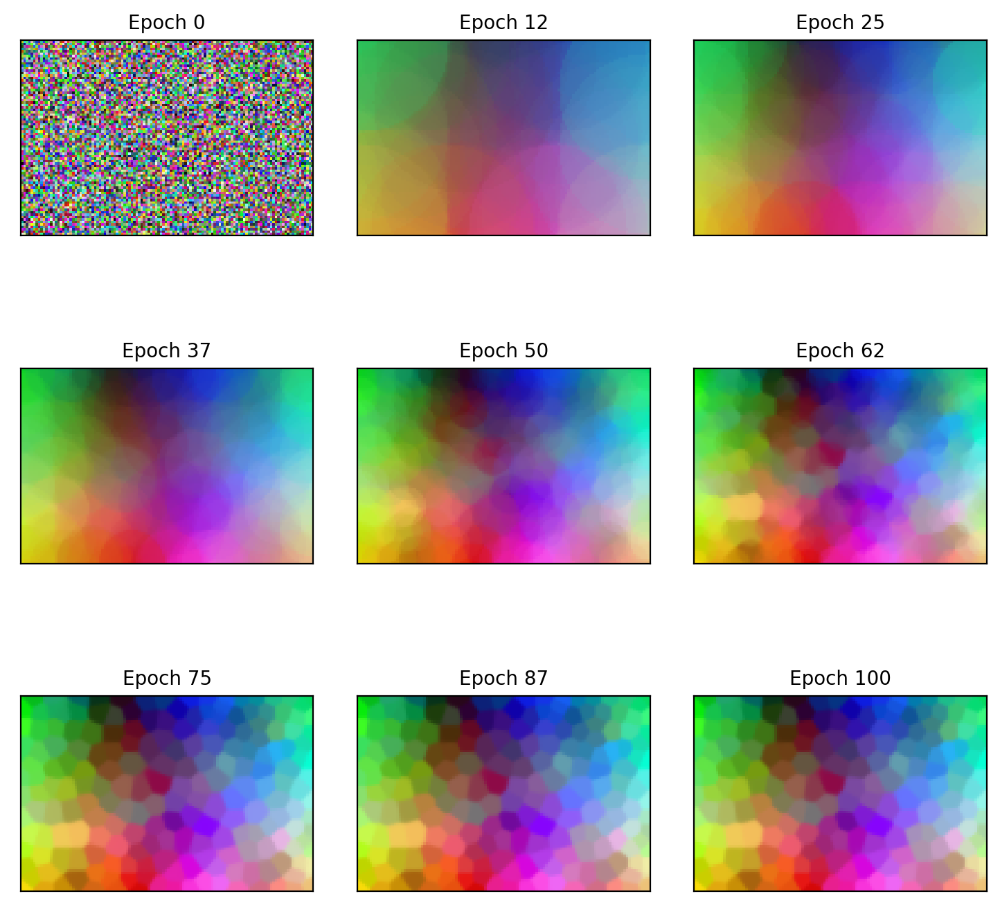

In [193]:
plot_images(images, width, height, 9)

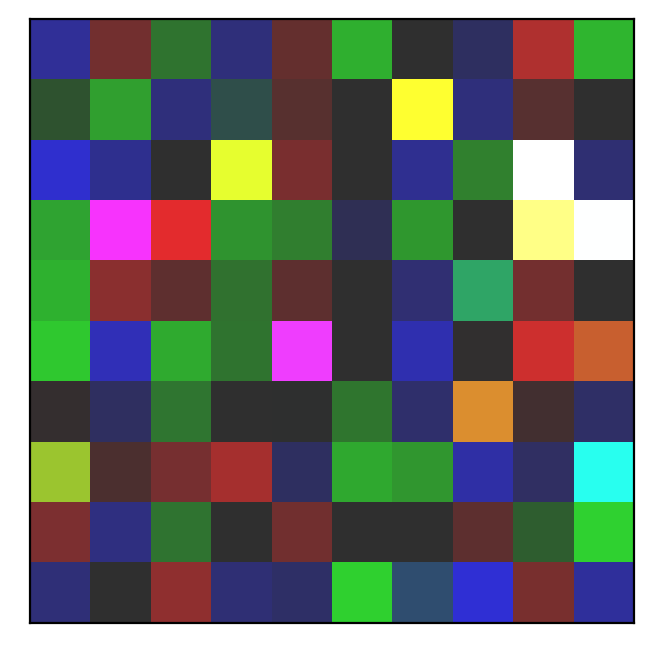

In [185]:
colors = colors_from_image(rgb, 100)
plot_colors(colors)

In [187]:
som = SOM(rgb.shape[1], rgb.shape[0], rgb.shape[2], r=np.sqrt(rgb.shape[1] * rgb.shape[0] / len(colors)), nodes=rgb)

epochs = 100
images = som.fit(colors, epochs, lr=0.5, verbose=True)

Epochs: 100%|#######################| 100/100 [00:18<00:00,  5.40it/s]


In [ ]:
animate_images(images[:len(images)//2], rgb.shape[1], rgb.shape[0], interval=100)

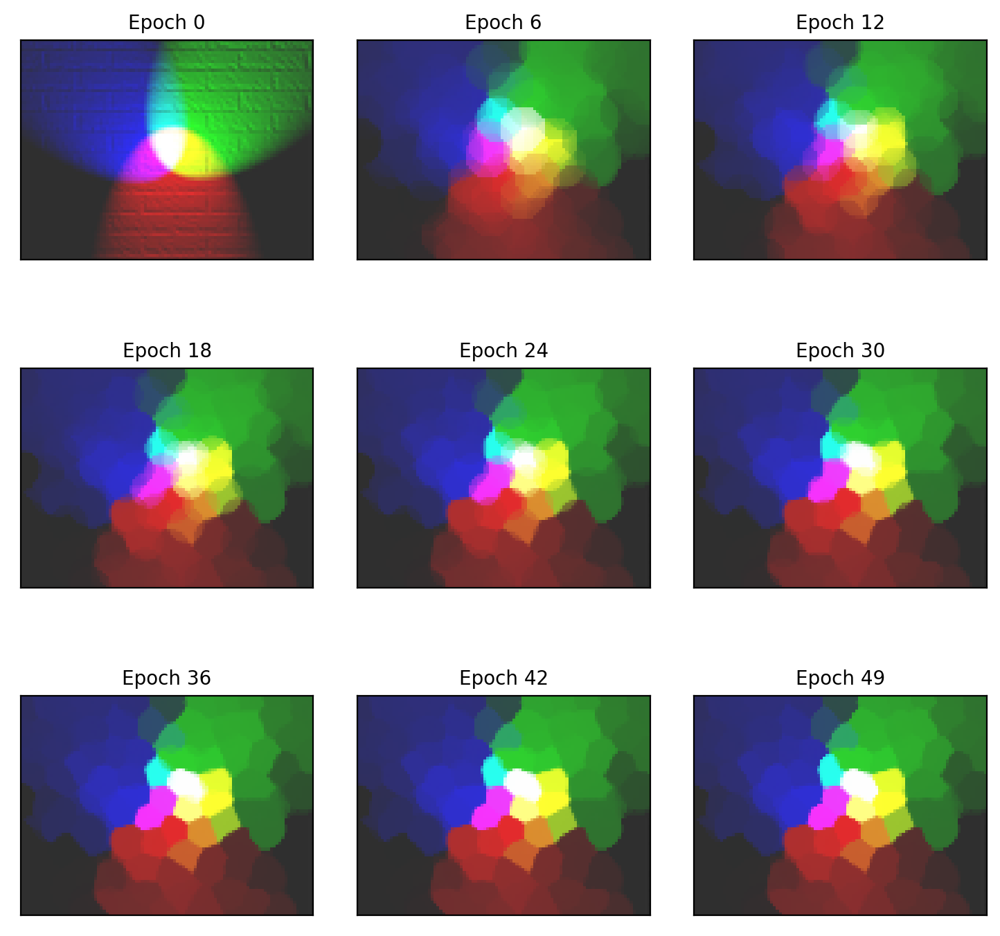

In [189]:
plot_images(images[:len(images)//2], rgb.shape[1], rgb.shape[0], 9)

In [162]:
image = load_image('img/town.png', 200, 150)
height, width, _ = image.shape

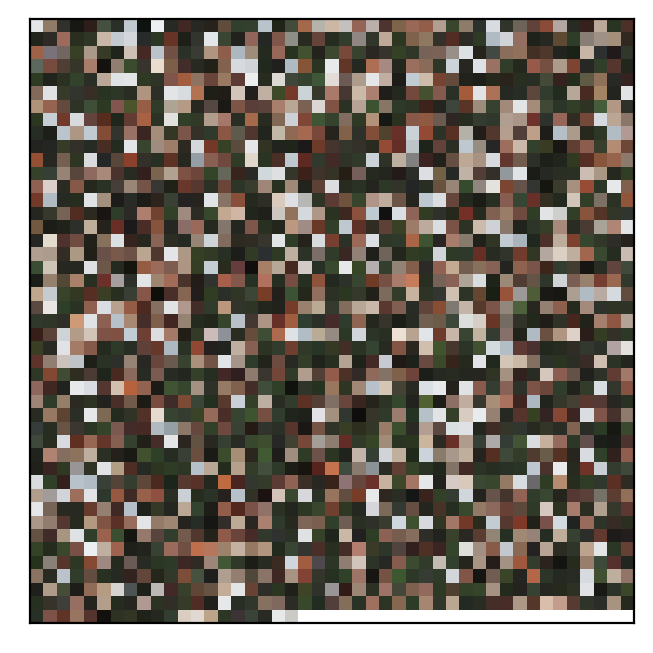

In [166]:
colors = colors_from_image(image, 2000)
plot_colors(colors)

In [167]:
som = SOM(width, height, 3, r=np.sqrt(width * height / len(colors)), nodes=image)
epochs = 100
images = som.fit(colors, epochs, lr=0.5, verbose=True)

Epochs: 100%|#######################| 100/100 [18:00<00:00, 10.81s/it]


In [168]:
animate_images(images[:len(images)//2], width, height, interval=100, video=True)

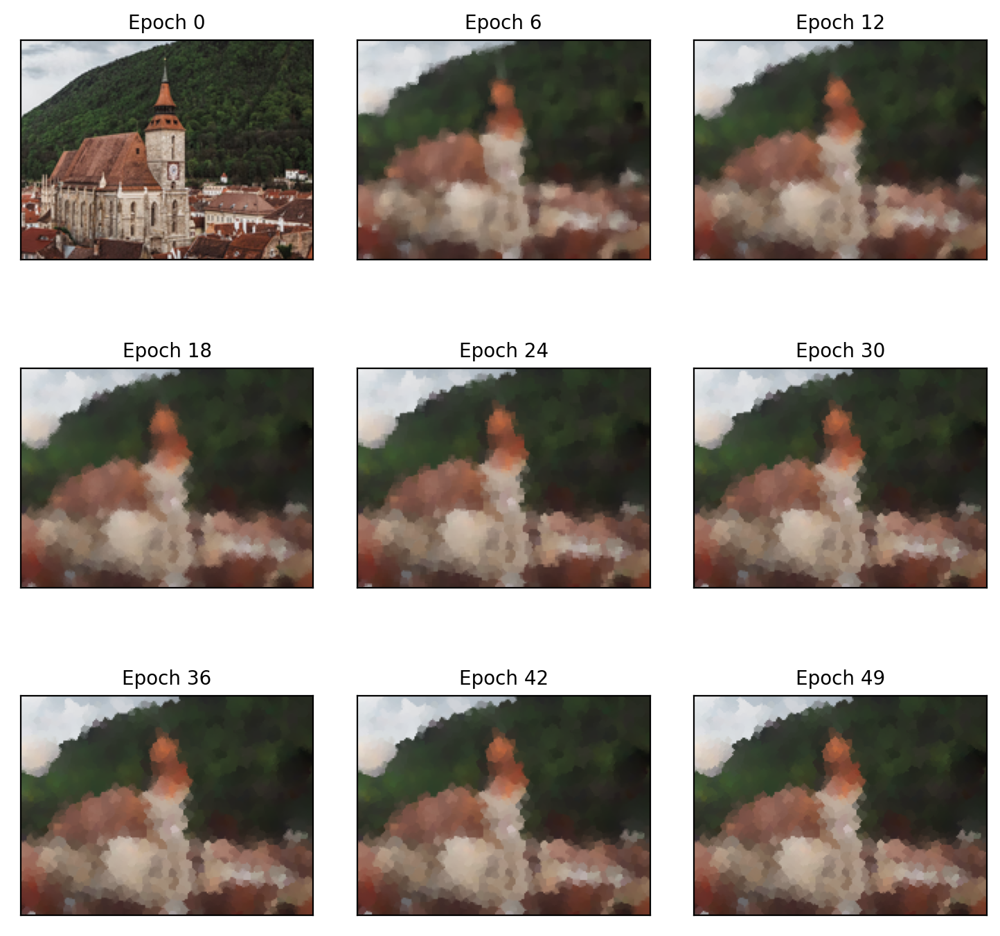

In [169]:
plot_images(images[:len(images)//2], width, height, 9)